In [ ]:
!pip install -q kaggle

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"divinzz","key":"32800cff3be960ce5163d24f1d88acc5"}'}

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content"
!chmod 600 /content/kaggle.json

In [ ]:
!kaggle datasets download -d vikashrajluhaniwal/fashion-images


Dataset URL: https://www.kaggle.com/datasets/vikashrajluhaniwal/fashion-images
License(s): CC0-1.0
100% 334M/335M [00:12<00:00, 35.9MB/s]
100% 335M/335M [00:12<00:00, 27.6MB/s]


In [ ]:
!unzip -o '*.zip' -d /content/fashion-images


In [ ]:
# Importing necessary libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Importing libraries for deep learning using Keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dropout, Flatten, Dense
from tensorflow.keras import applications

# Importing library for calculating pairwise distances
from sklearn.metrics import pairwise_distances

# Importing library for making HTTP requests
import requests

# Importing the Python Imaging Library for image processing
from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

# Importing the pickle library for serialization and deserialization of Python objects
import pickle

# Importing the datetime library for working with dates and times
from datetime import datetime

# Importing libraries for creating interactive visualizations with Plotly
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px

# Importing the library for displaying images in Jupyter notebooks
from IPython.display import display, Image

# Reading the fashion dataset into a Pandas DataFrame
fashion_df = pd.read_csv("/content/fashion-images/data/fashion.csv")

# Displaying the DataFrame
fashion_df.head()  # Display first few rows to confirm data loaded correctly


,ProductId,Gender,Category,SubCategory,ProductType,Colour,Usage,ProductTitle,Image,ImageURL
0,42419,Girls,Apparel,Topwear,Tops,White,Casual,Gini and Jony Girls Knit White Top,42419.jpg,http://assets.myntassets.com/v1/images/style/p...
1,34009,Girls,Apparel,Topwear,Tops,Black,Casual,Gini and Jony Girls Black Top,34009.jpg,http://assets.myntassets.com/v1/images/style/p...
2,40143,Girls,Apparel,Topwear,Tops,Blue,Casual,Gini and Jony Girls Pretty Blossom Blue Top,40143.jpg,http://assets.myntassets.com/v1/images/style/p...
3,23623,Girls,Apparel,Topwear,Tops,Pink,Casual,Doodle Kids Girls Pink I love Shopping Top,23623.jpg,http://assets.myntassets.com/v1/images/style/p...
4,47154,Girls,Apparel,Bottomwear,Capris,Black,Casual,Gini and Jony Girls Black Capris,47154.jpg,http://assets.myntassets.com/v1/images/style/p...


In [ ]:
print("Total number of products : ", fashion_df.shape[0])
print("Total number of unique subcategories : ", fashion_df["SubCategory"].nunique())
print("Total number of unique gender types : ", fashion_df["Gender"].nunique())

Total number of products :  2906
Total number of unique subcategories :  9
Total number of unique gender types :  4


In [ ]:
fashion_df["Gender"].value_counts()

,count
Gender,
Men,811
Women,769
Boys,759
Girls,567


In [ ]:
apparel_boys = fashion_df[fashion_df["Gender"]=="Boys"]
apparel_girls = fashion_df[fashion_df["Gender"]=="Girls"]
footwear_men = fashion_df[fashion_df["Gender"]=="Men"]
footwear_women = fashion_df[fashion_df["Gender"]=="Women"]

In [ ]:
# Setting the dimensions for input images
img_width, img_height = 224, 224

# Directory path for training data
train_data_dir = "//content/fashion-images/data/Footwear/Men/Images/"

# Number of training samples
nb_train_samples = 811

# Number of training epochs
epochs = 50

# Batch size for training
batch_size = 1

# Function to extract features using a pre-trained ResNet50 model
def extract_features():
    # List to store item codes extracted from file names
    Itemcodes = []

    # ImageDataGenerator for preprocessing images
    datagen = ImageDataGenerator(rescale=1. / 255)

    # Loading the ResNet50 model without the top layers
    model = applications.ResNet50(include_top=False, weights='imagenet')

    # Generating a flow of images from the specified directory
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    # Extracting item codes from file names
    for i in generator.filenames:
        Itemcodes.append(i[(i.find("/")+1):i.find(".")])

    # Predicting features using the ResNet50 model
    extracted_features = model.predict(generator, nb_train_samples // batch_size)

    # Reshaping the extracted features
    extracted_features = extracted_features.reshape((811, 100352))

    # Saving the extracted features and corresponding item codes as numpy arrays
    np.save(open('./Men_ResNet_features.npy', 'wb'), extracted_features)
    np.save(open('./Men_ResNet_feature_product_ids.npy', 'wb'), np.array(Itemcodes))

# Recording the start time
a = datetime.now()

# Calling the feature extraction function
extract_features()

# Printing the time taken for feature extraction
print("Time taken in feature extraction", datetime.now()-a)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step
Found 811 images belonging to 1 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


811/811 ━━━━━━━━━━━━━━━━━━━━ 194s 237ms/step
Time taken in feature extraction 0:03:24.565005


In [ ]:
# Loading previously saved extracted features and corresponding product IDs from numpy files
extracted_features = np.load('/content/Men_ResNet_features.npy')
Productids = np.load('/content/Men_ResNet_feature_product_ids.npy')

# Creating a copy of the original 'footwear_men' DataFrame
men = footwear_men.copy()

# Alternatively, reading a CSV file into the 'men' DataFrame
# men = pd.read_csv('./footwear_men.csv')

# Extracting the 'ProductId' column values from the 'men' DataFrame and converting to a list
df_Productids = list(men['ProductId'])

# Converting the 'Productids' numpy array to a list
Productids = list(Productids)

==================== input product image ====================


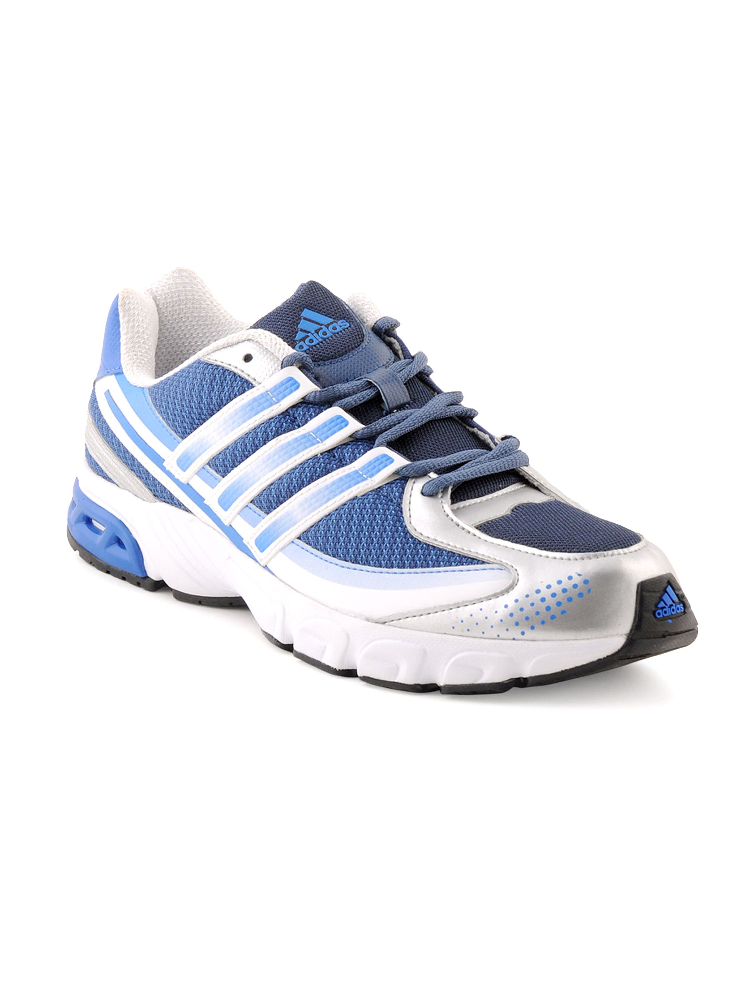

Product Title:  ADIDAS Men Adi Quest Blue Sports Shoes

 ==================== Recommended products ====================


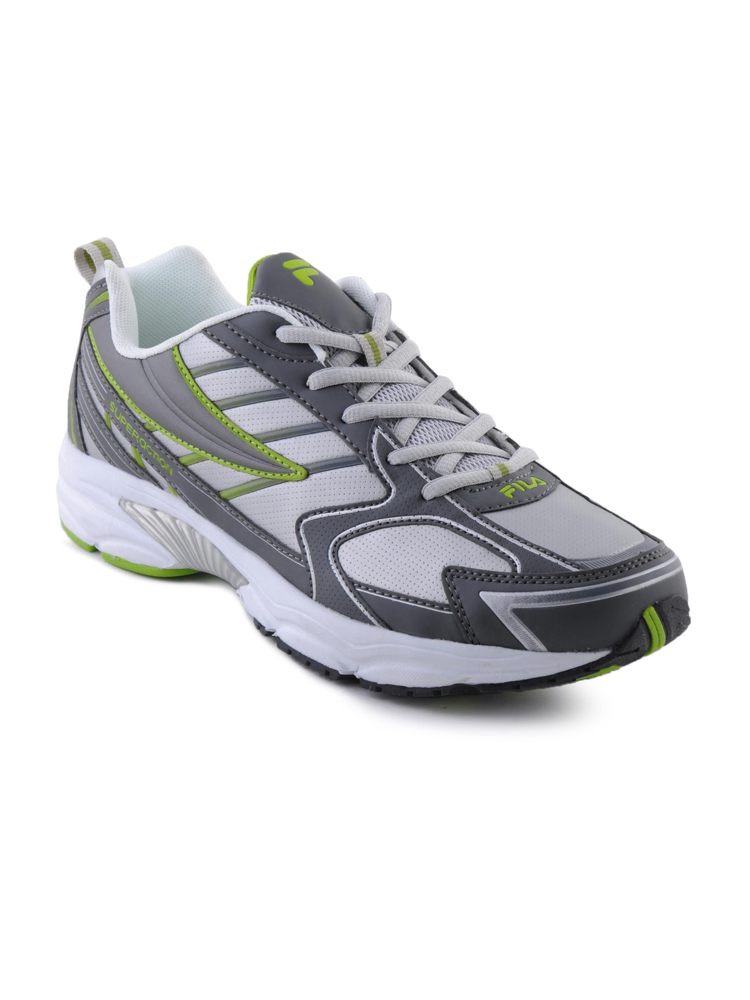

Product Title:  Fila Men Destiny Grey Sports Shoes
Euclidean Distance from input image: 27.64643


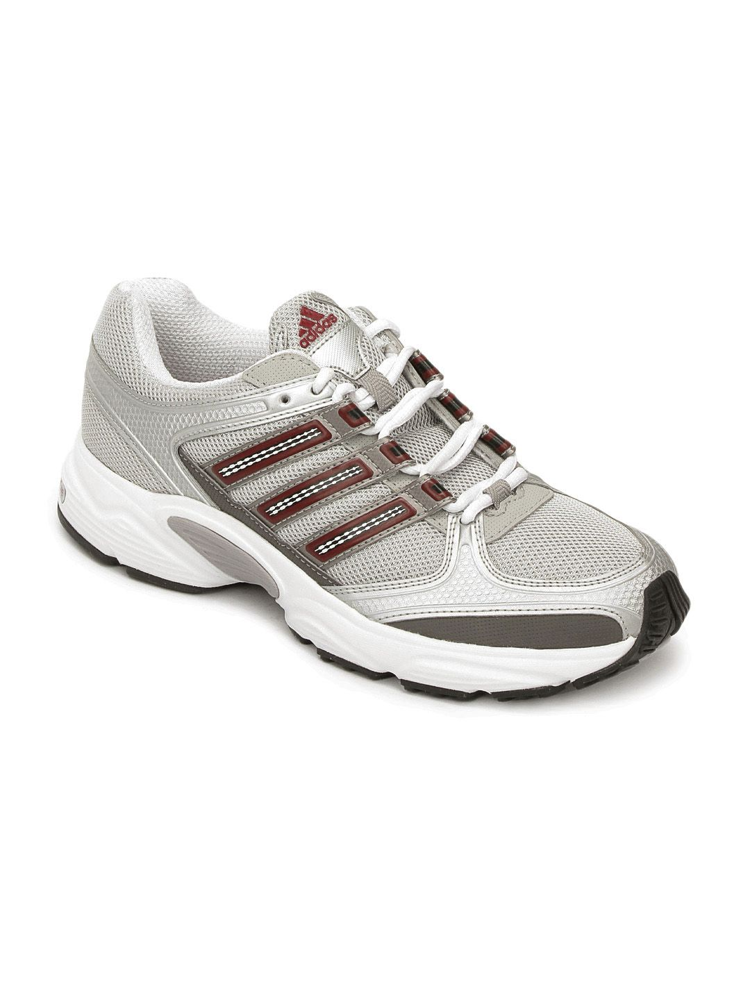

Product Title:  ADIDAS Men Silver Phaedra Shoes
Euclidean Distance from input image: 29.37411


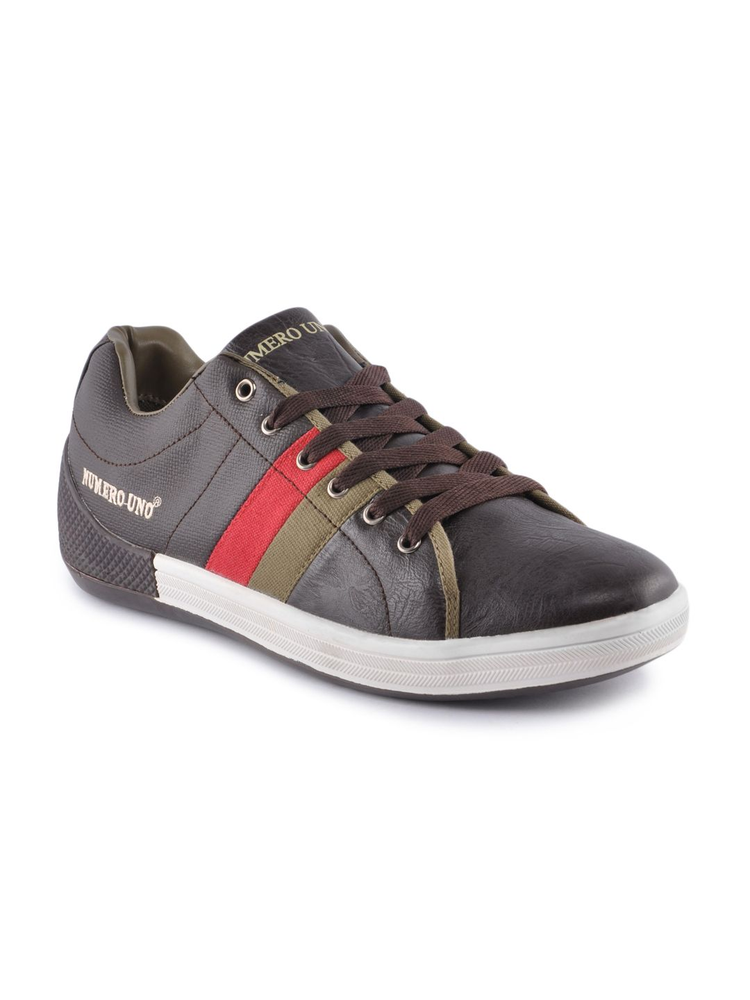

Product Title:  Numero Uno Men Brown Casual Shoes
Euclidean Distance from input image: 30.170872


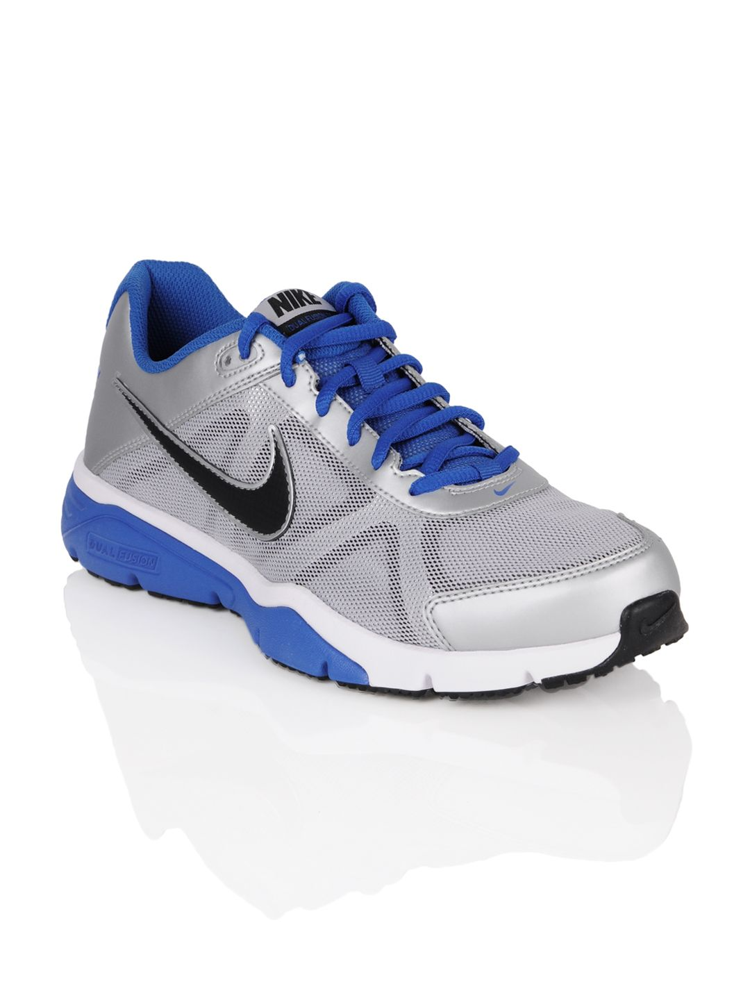

Product Title:  Nike Men Dual Fusion TR III Grey Sports Shoes
Euclidean Distance from input image: 30.894947


In [ ]:
# Function to retrieve similar products using CNN-based feature extraction
def get_similar_products_cnn(product_id, num_results):
    # Finding the index of the input product ID in the list of product IDs
    doc_id = Productids.index(product_id)

    # Calculating pairwise distances between the input product and all other products
    pairwise_dist = pairwise_distances(extracted_features, extracted_features[doc_id].reshape(1,-1))

    # Finding the indices of the most similar products
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    # Extracting and displaying the input product image and details
    print("="*20, "input product image", "="*20)
    ip_row = men[['ImageURL','ProductTitle']].loc[men['ProductId']==int(Productids[indices[0]])]
    for indx, row in ip_row.iterrows():
        display(Image(url=row['ImageURL'], width = 224, height = 224, embed=True))
        print('Product Title: ', row['ProductTitle'])

    # Displaying the recommended products and their details
    print("\n","="*20, "Recommended products", "="*20)
    for i in range(1,len(indices)):
        rows = men[['ImageURL','ProductTitle']].loc[men['ProductId']==int(Productids[indices[i]])]
        for indx, row in rows.iterrows():
            display(Image(url=row['ImageURL'], width = 224, height = 224, embed=True))
            print('Product Title: ', row['ProductTitle'])
            print('Euclidean Distance from input image:', pdists[i])

# Example: Retrieving 5 similar products for the input product ID '13683'
get_similar_products_cnn('13683', 5)

For Gender - Women

In [ ]:
# Setting the dimensions for input images
img_width, img_height = 224, 224

# Directory path for training data
train_data_dir = "/content/fashion-images/data/Footwear/Women/Images"

# Number of training samples
nb_train_samples = 769

# Number of training epochs
epochs = 50

# Batch size for training
batch_size = 1

# Function to extract features using a pre-trained ResNet50 model for women's footwear
def extract_features():
    # List to store item codes extracted from file names
    Itemcodes = []

    # ImageDataGenerator for preprocessing images
    datagen = ImageDataGenerator(rescale=1. / 255)

    # Loading the ResNet50 model without the top layers
    model = applications.ResNet50(include_top=False, weights='imagenet')

    # Generating a flow of images from the specified directory
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    # Extracting item codes from file names
    for i in generator.filenames:
        Itemcodes.append(i[(i.find("/")+1):i.find(".")])

    # Predicting features using the ResNet50 model
    extracted_features = model.predict(generator, nb_train_samples // batch_size)

    # Reshaping the extracted features
    extracted_features = extracted_features.reshape((769, 100352))

    # Saving the extracted features and corresponding item codes as numpy arrays
    np.save(open('./Women_ResNet_features.npy', 'wb'), extracted_features)
    np.save(open('./Women_ResNet_feature_product_ids.npy', 'wb'), np.array(Itemcodes))

# Recording the start time
a = datetime.now()

# Calling the feature extraction function
extract_features()

# Printing the time taken for feature extraction
print("Time taken in feature extraction", datetime.now()-a)

Found 769 images belonging to 1 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


769/769 ━━━━━━━━━━━━━━━━━━━━ 185s 238ms/step
Time taken in feature extraction 0:03:11.813324


For Gender - Boys

In [ ]:
img_width, img_height = 224, 224

# Directory path for training data
train_data_dir = "/content/fashion-images/data/Apparel/Boys/Images"

# Number of training samples
nb_train_samples = 759

# Number of training epochs
epochs = 50

# Batch size for training
batch_size = 1

# Function to extract features using a pre-trained ResNet50 model for boys' apparel
def extract_features():
    # List to store item codes extracted from file names
    Itemcodes = []

    # ImageDataGenerator for preprocessing images
    datagen = ImageDataGenerator(rescale=1. / 255)

    # Loading the ResNet50 model without the top layers
    model = applications.ResNet50(include_top=False, weights='imagenet')

    # Generating a flow of images from the specified directory
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    # Extracting item codes from file names
    for i in generator.filenames:
        Itemcodes.append(i[(i.find("/")+1):i.find(".")])

    # Predicting features using the ResNet50 model
    extracted_features = model.predict(generator, nb_train_samples // batch_size)

    # Reshaping the extracted features
    extracted_features = extracted_features.reshape((759, 100352))

    # Saving the extracted features and corresponding item codes as numpy arrays
    np.save(open('./Boys_ResNet_features.npy', 'wb'), extracted_features)
    np.save(open('./Boys_ResNet_feature_product_ids.npy', 'wb'), np.array(Itemcodes))

# Recording the start time
a = datetime.now()

# Calling the feature extraction function
extract_features()

# Printing the time taken for feature extraction
print("Time taken in feature extraction", datetime.now()-a)

Found 759 images belonging to 1 classes.
759/759 ━━━━━━━━━━━━━━━━━━━━ 187s 244ms/step
Time taken in feature extraction 0:03:14.530176


For Gender - Girls

In [ ]:
# Setting the dimensions for input images
img_width, img_height = 224, 224

# Directory path for training data
train_data_dir = "/content/fashion-images/data/Apparel/Girls/Images"

# Number of training samples
nb_train_samples = 567

# Number of training epochs
epochs = 50

# Batch size for training
batch_size = 1

# Function to extract features using a pre-trained ResNet50 model for girls' apparel
def extract_features():
    # List to store item codes extracted from file names
    Itemcodes = []

    # ImageDataGenerator for preprocessing images
    datagen = ImageDataGenerator(rescale=1. / 255)

    # Loading the ResNet50 model without the top layers
    model = applications.ResNet50(include_top=False, weights='imagenet')

    # Generating a flow of images from the specified directory
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)

    # Extracting item codes from file names
    for i in generator.filenames:
        Itemcodes.append(i[(i.find("/")+1):i.find(".")])

    # Predicting features using the ResNet50 model
    extracted_features = model.predict(generator, nb_train_samples // batch_size)

    # Reshaping the extracted features
    extracted_features = extracted_features.reshape((567, 100352))

    # Saving the extracted features and corresponding item codes as numpy arrays
    np.save(open('./Girls_ResNet_features.npy', 'wb'), extracted_features)
    np.save(open('./Girls_ResNet_feature_product_ids.npy', 'wb'), np.array(Itemcodes))

# Recording the start time
a = datetime.now()

# Calling the feature extraction function
extract_features()

# Printing the time taken for feature extraction
print("Time taken in feature extraction", datetime.now()-a)

Found 567 images belonging to 1 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


567/567 ━━━━━━━━━━━━━━━━━━━━ 152s 263ms/step
Time taken in feature extraction 0:02:35.485444


5. Deploying the solution

In [ ]:
# Loading previously saved extracted features and corresponding product IDs for boys' apparel
boys_extracted_features = np.load('/content/Boys_ResNet_features.npy')
boys_Productids = np.load('/content/Boys_ResNet_feature_product_ids.npy')

# Loading previously saved extracted features and corresponding product IDs for girls' apparel
girls_extracted_features = np.load('/content/Girls_ResNet_features.npy')
girls_Productids = np.load('/content/Girls_ResNet_feature_product_ids.npy')

# Loading previously saved extracted features and corresponding product IDs for men's footwear
men_extracted_features = np.load('/content/Men_ResNet_features.npy')
men_Productids = np.load('/content/Men_ResNet_feature_product_ids.npy')

# Loading previously saved extracted features and corresponding product IDs for women's footwear
women_extracted_features = np.load('/content/Women_ResNet_features.npy')
women_Productids = np.load('/content/Women_ResNet_feature_product_ids.npy')

# Converting the 'ProductId' column in the 'fashion_df' DataFrame to string type
fashion_df["ProductId"] = fashion_df["ProductId"].astype(str)

In [ ]:
def get_similar_products_cnn(product_id, num_results):
    # Determining the gender category of the input product
    gender_category = fashion_df[fashion_df['ProductId'] == product_id]['Gender'].values[0]

    # Selecting the appropriate set of pre-extracted features and product IDs based on the gender category
    if gender_category == "Boys":
        extracted_features = boys_extracted_features
        Productids = boys_Productids
    elif gender_category == "Girls":
        extracted_features = girls_extracted_features
        Productids = girls_Productids
    elif gender_category == "Men":
        extracted_features = men_extracted_features
        Productids = men_Productids
    elif gender_category == "Women":
        extracted_features = women_extracted_features
        Productids = women_Productids

    # Converting the product IDs to a list
    Productids = list(Productids)

    # Finding the index of the input product ID in the list of product IDs
    doc_id = Productids.index(product_id)

    # Calculating pairwise distances between the input product and all other products
    pairwise_dist = pairwise_distances(extracted_features, extracted_features[doc_id].reshape(1,-1))

    # Finding the indices of the most similar products
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    # Extracting and displaying the input product image and details
    print("="*20, "input product details", "="*20)
    ip_row = fashion_df[['ImageURL','ProductTitle']].loc[fashion_df['ProductId']==Productids[indices[0]]]
    for indx, row in ip_row.iterrows():
        display(Image(url=row['ImageURL'], width = 224, height = 224, embed=True))
        print('Product Title: ', row['ProductTitle'])

    # Displaying the recommended products and their details
    print("\n","="*20, "Recommended products", "="*20)
    for i in range(1,len(indices)):
        rows = fashion_df[['ImageURL','ProductTitle']].loc[fashion_df['ProductId']==Productids[indices[i]]]
        for indx, row in rows.iterrows():
            display(Image(url=row['ImageURL'], width = 224, height = 224, embed=True))
            print('Product Title: ', row['ProductTitle'])
            print('Euclidean Distance from input image:', pdists[i])

==================== input product details ====================


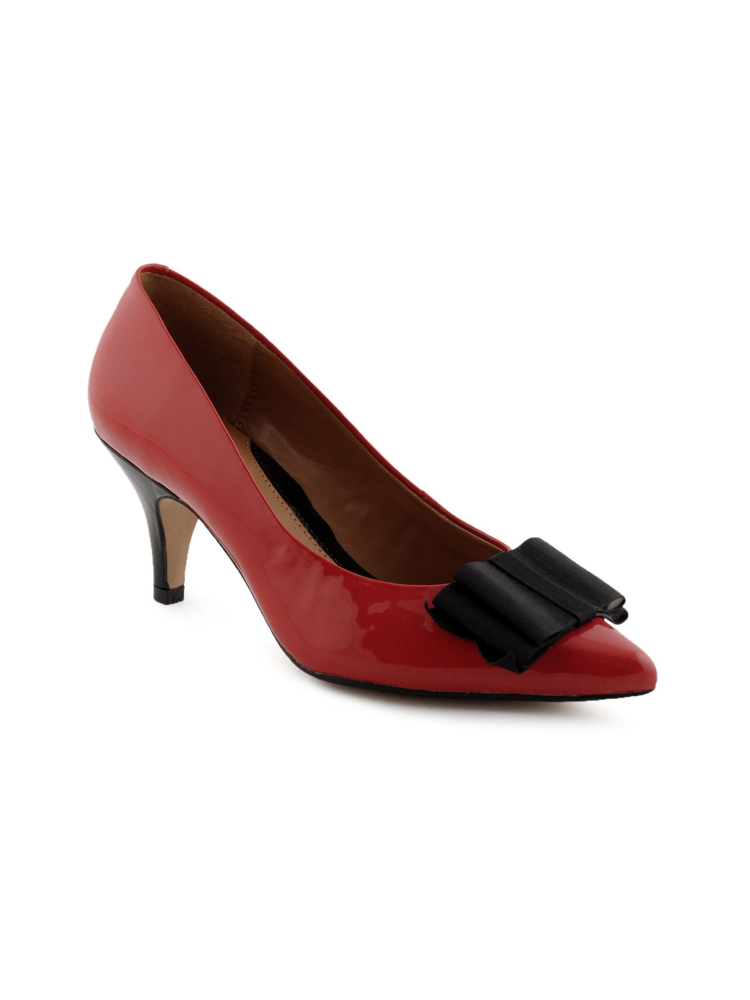

Product Title:  Clarks Women Balti Zing Red Heels

 ==================== Recommended products ====================


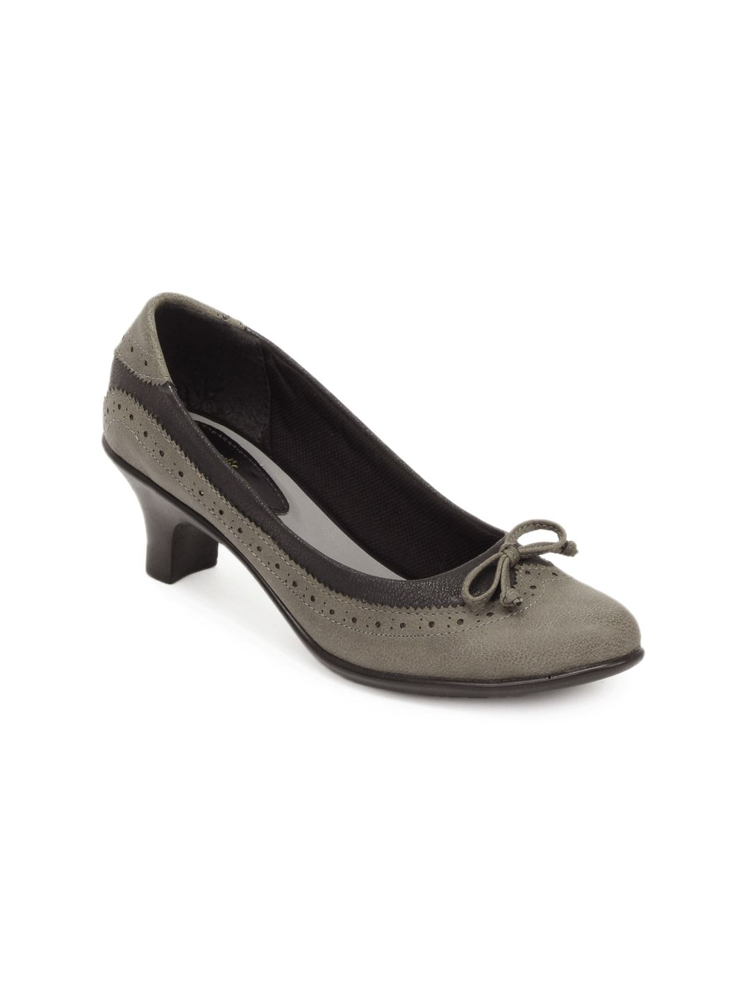

Product Title:  Catwalk Women Black & Grey Heels
Euclidean Distance from input image: 41.760273


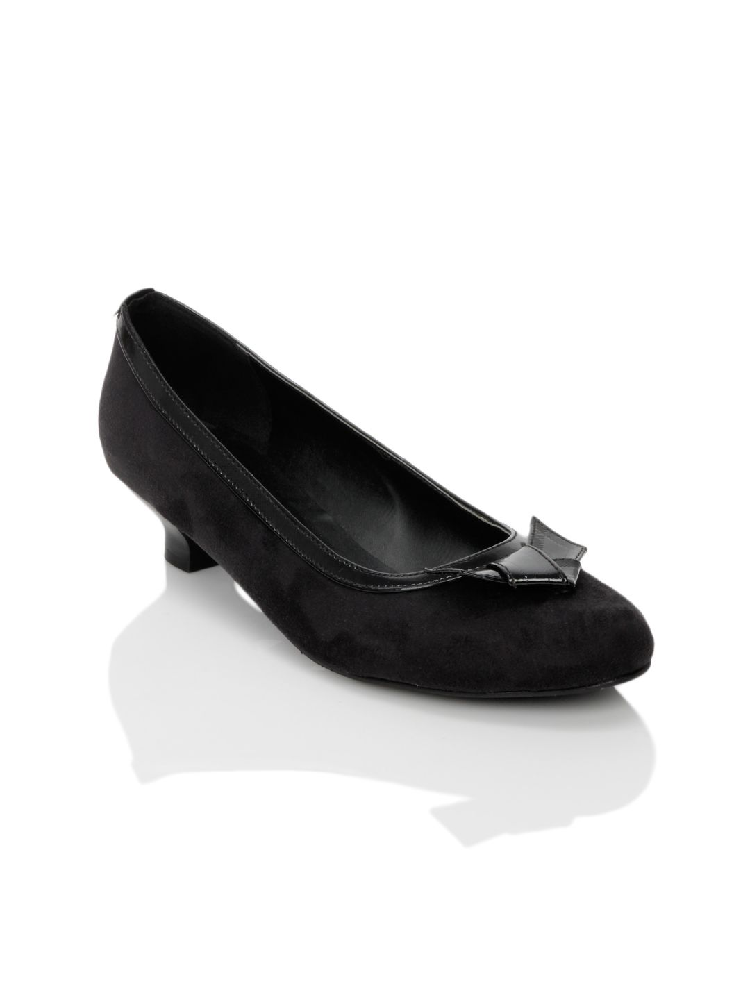

Product Title:  Rocia Women Black Shoes
Euclidean Distance from input image: 44.68569


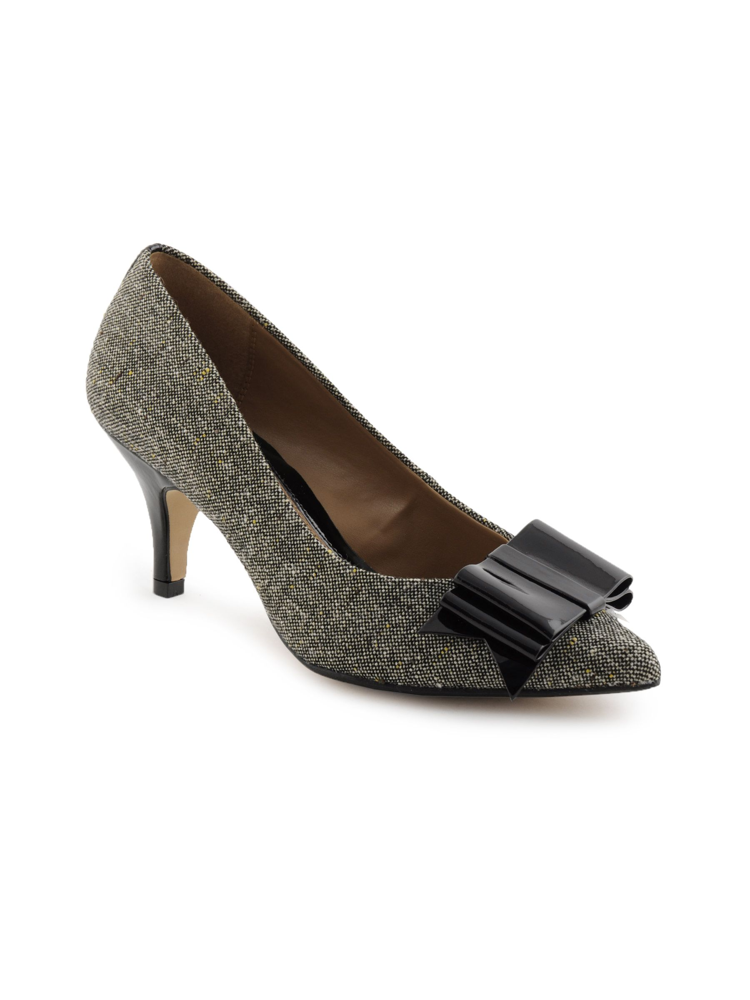

Product Title:  Clarks Women Balti Zing Black Heels
Euclidean Distance from input image: 45.104374


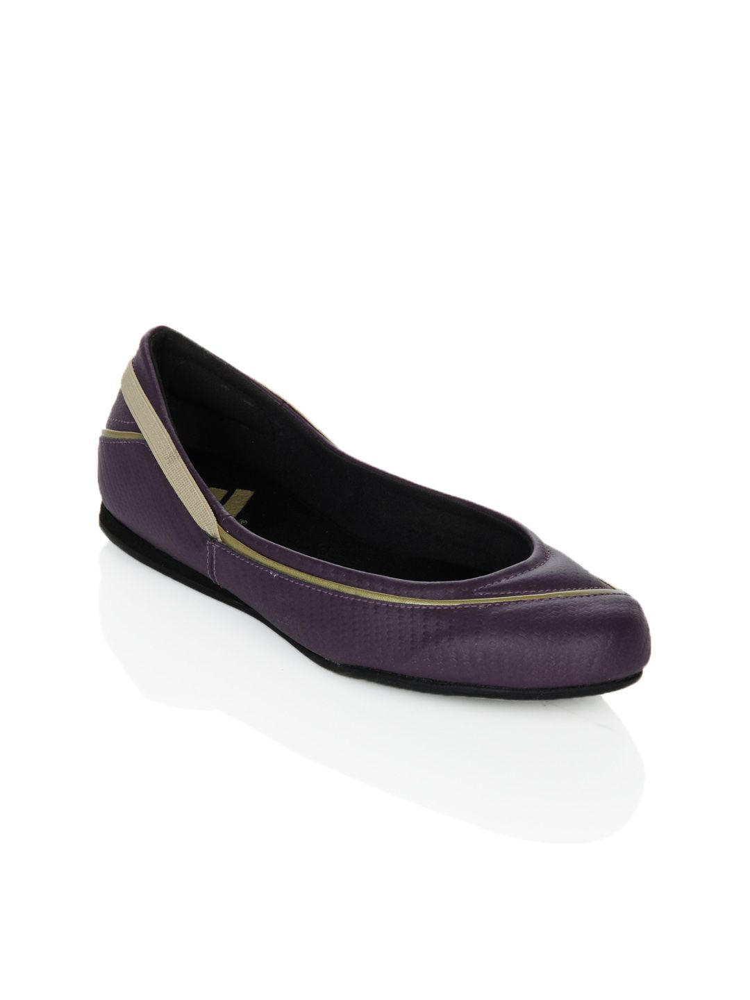

Product Title:  ADIDAS Women Ballerina Purple Shoes
Euclidean Distance from input image: 46.14964


In [ ]:
get_similar_products_cnn('21030', 5)


==================== input product details ====================


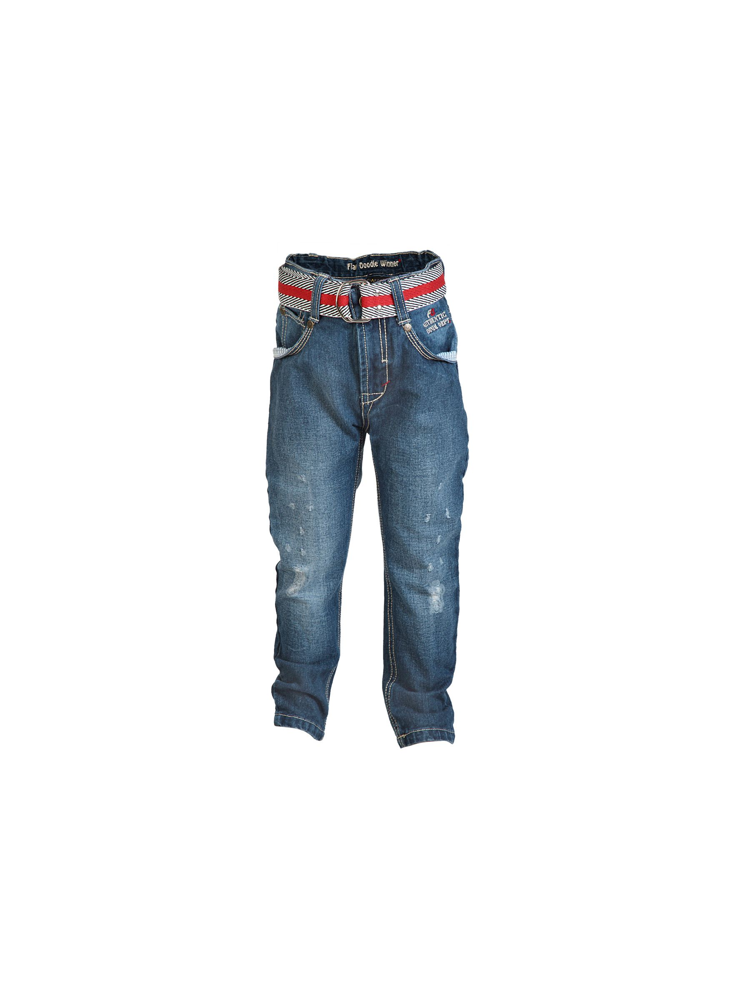

Product Title:  Doodle Boys-Boys Washed Blue Jeans

 ==================== Recommended products ====================


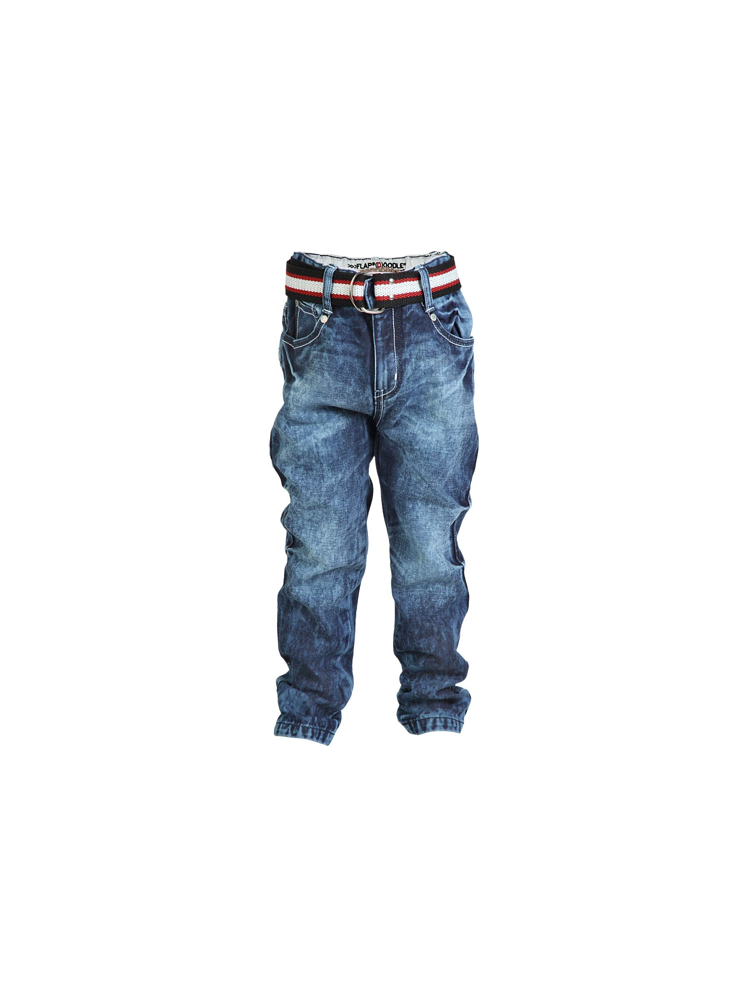

Product Title:  Doodle Boys-Boys Acid Wash Blue Jeans
Euclidean Distance from input image: 19.667305


HTTPError: HTTP Error 503: Service Unavailable

In [ ]:
get_similar_products_cnn('18181', 5)

In [ ]:
get_similar_products_cnn('37633', 5)

In [ ]:
get_similar_products_cnn('15519', 5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
==================== Input Product Details ====================


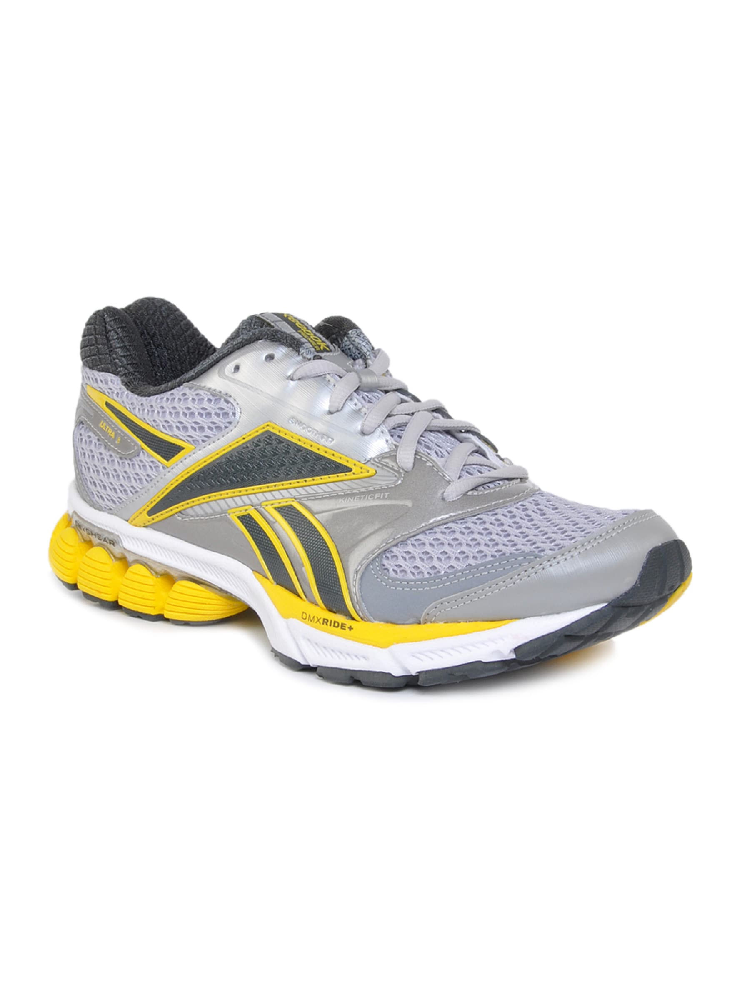


 ==================== Recommended Products ====================


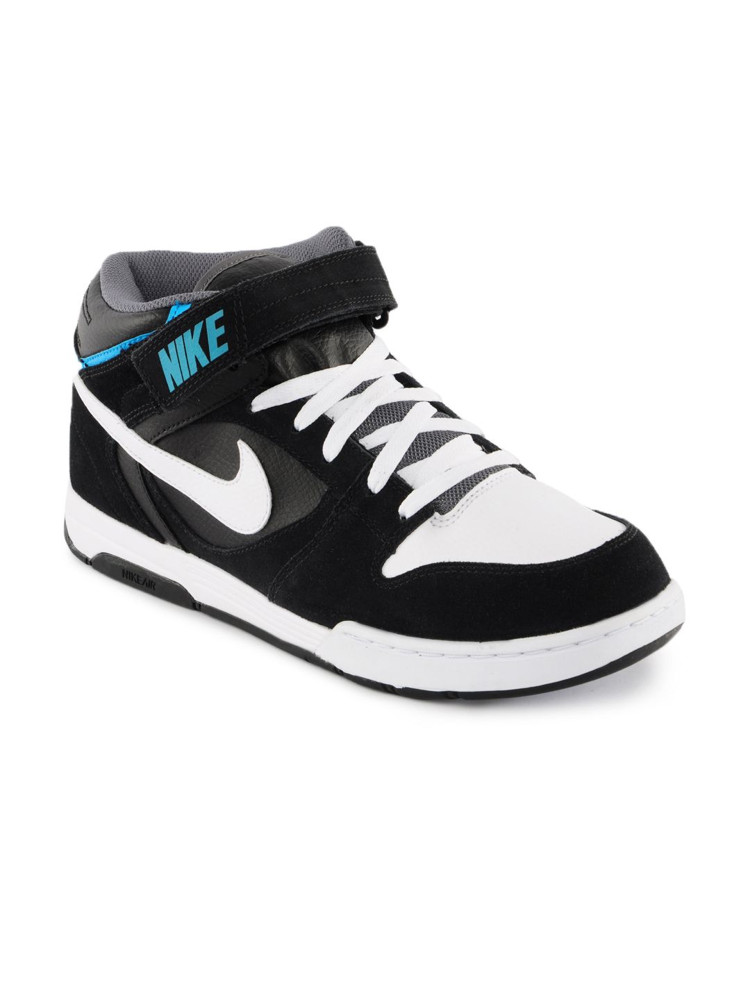

Product Title:  Nike Men Air Twilight Black Shoes
Euclidean Distance from input image: 707.53284


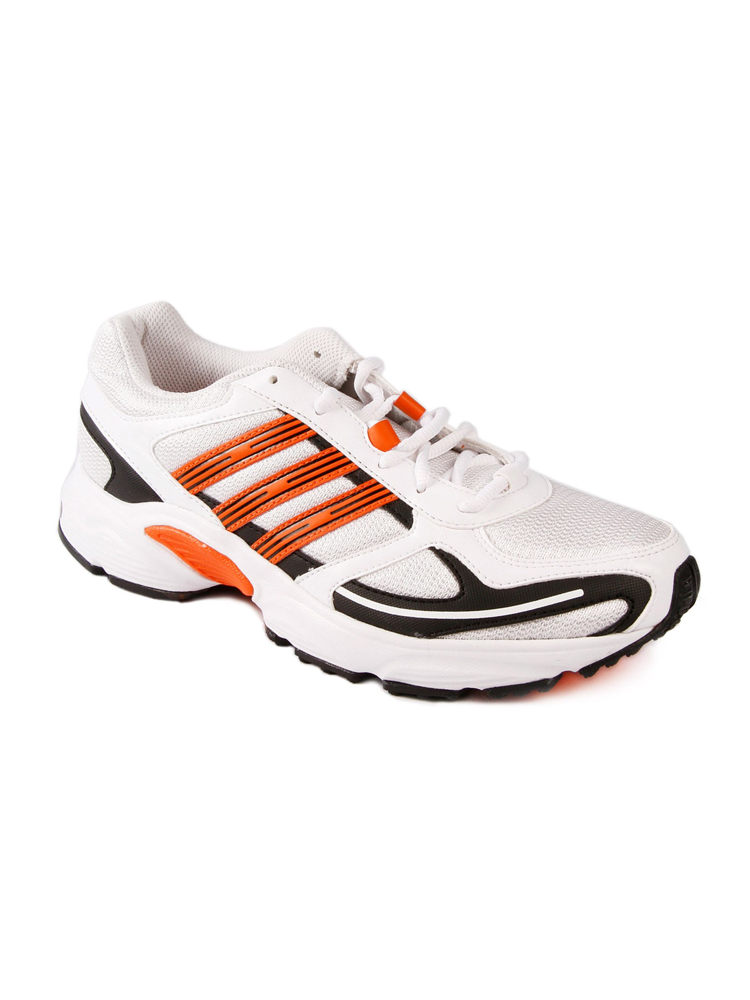

Product Title:  ADIDAS Men Adi Fiero M White Sports Shoes
Euclidean Distance from input image: 709.36523


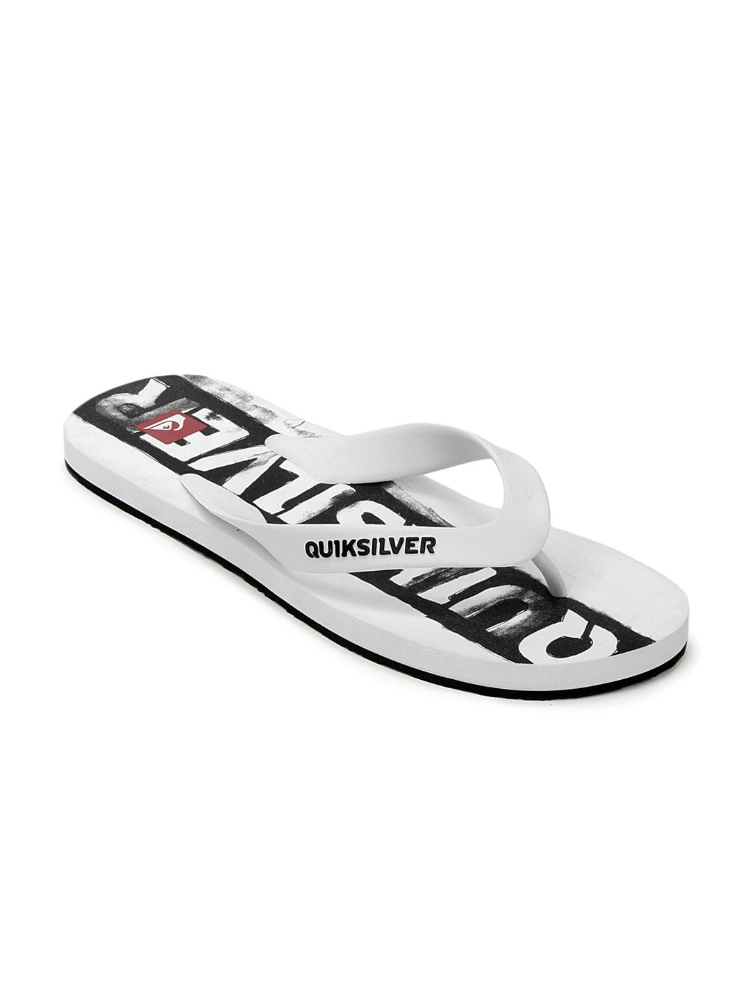

Product Title:  Quiksilver Men White Flip Flops
Euclidean Distance from input image: 709.70905


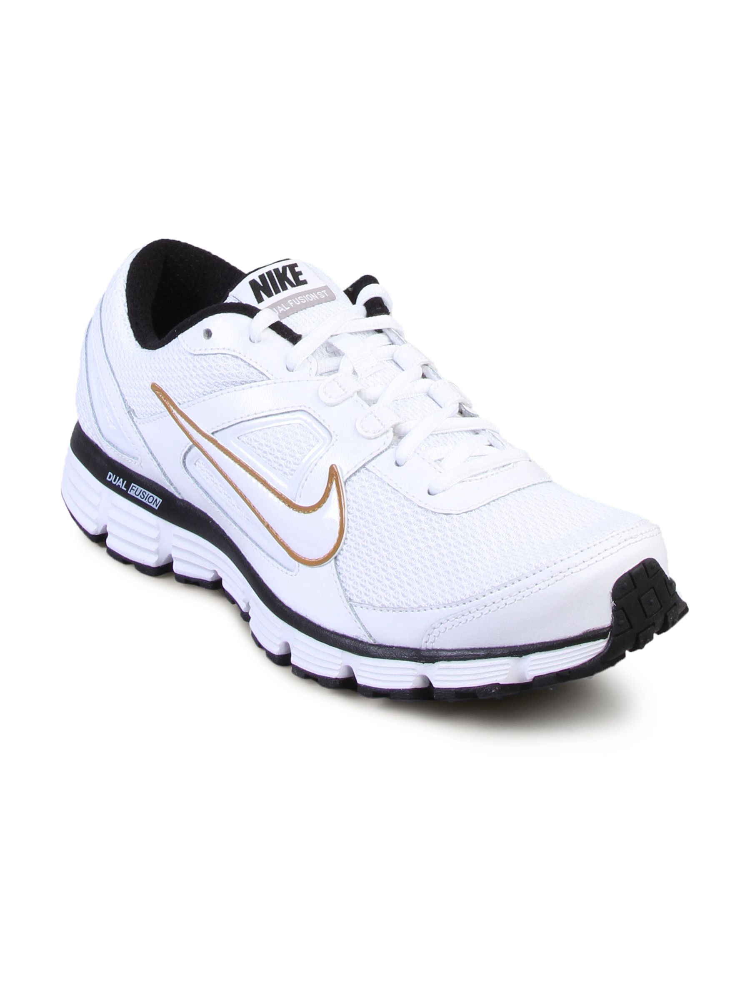

Product Title:  Nike Men's Dual Fusion White Shoe
Euclidean Distance from input image: 709.9378


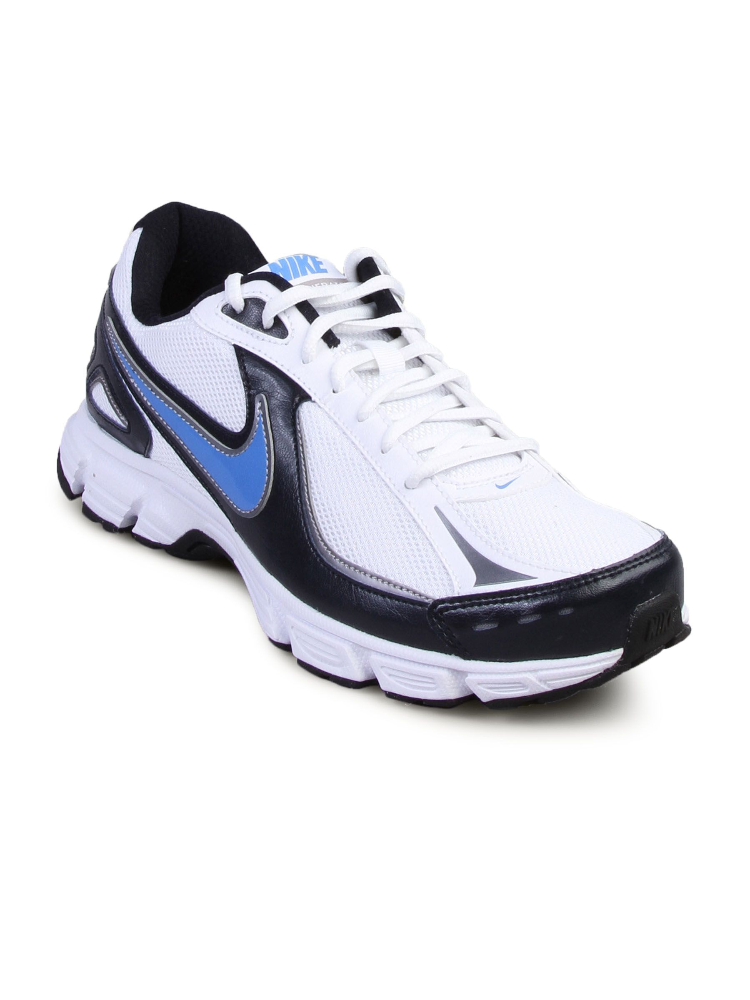

Product Title:  Nike Men's Incinerate MSL White Blue Shoe
Euclidean Distance from input image: 710.00574


In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
from sklearn.metrics import pairwise_distances
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from IPython.display import Image, display
from PIL import Image as PILImage  # Import PIL Image for displaying
import io  # Import io module for handling byte data

# Load pre-extracted features and product IDs (replace with actual paths)
boys_extracted_features = np.load('/content/Boys_ResNet_features.npy')
boys_Productids = np.load('/content/Boys_ResNet_feature_product_ids.npy')

girls_extracted_features = np.load('/content/Girls_ResNet_features.npy')
girls_Productids = np.load('/content/Girls_ResNet_feature_product_ids.npy')

men_extracted_features = np.load('/content/Men_ResNet_features.npy')
men_Productids = np.load('/content/Men_ResNet_feature_product_ids.npy')

women_extracted_features = np.load('/content/Women_ResNet_features.npy')
women_Productids = np.load('/content/Women_ResNet_feature_product_ids.npy')

# Load the product data (with image URLs and titles)
fashion_df = pd.read_csv('/content/fashion-images/data/fashion.csv')
fashion_df["ProductId"] = fashion_df["ProductId"].astype(str)

# ResNet50 model for feature extraction (without top layers for feature extraction)
model = ResNet50(weights='imagenet', include_top=False)  # Load ResNet50 without the top layer
model = tf.keras.Sequential([
    model,
    tf.keras.layers.GlobalMaxPooling2D()  # Add GlobalMaxPooling2D for consistent feature size
])

# Function to extract features from an input image
def extract_features(image_path):
    # Load image
    img = image.load_img(image_path, target_size=(224, 224))  # ResNet50 expects 224x224 images
    img_array = image.img_to_array(img)  # Convert image to numpy array
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = preprocess_input(img_array)  # Preprocess the image for ResNet50

    # Load the same ResNet50 model used to extract the pre-computed features
    base_model = ResNet50(include_top=False, weights='imagenet')

    # Extract features
    features = base_model.predict(img_array)
    features = features.reshape((1, 100352))  # Reshape to match pre-extracted features dimensions
    return features

# Function to get similar products based on an input image and category
def get_similar_products_by_image(image_path, gender_category, num_results=5):
    # Extract features from the input image
    input_image_features = extract_features(image_path)

    # Select the appropriate set of pre-extracted features and product IDs based on the gender category
    if gender_category == "Boys":
        extracted_features = boys_extracted_features
        Productids = boys_Productids
    elif gender_category == "Girls":
        extracted_features = girls_extracted_features
        Productids = girls_Productids
    elif gender_category == "Men":
        extracted_features = men_extracted_features
        Productids = men_Productids
    elif gender_category == "Women":
        extracted_features = women_extracted_features
        Productids = women_Productids
    else:
        print("Invalid gender category")
        return

    # Calculate pairwise distances between the input image features and all other products
    pairwise_dist = pairwise_distances(extracted_features, input_image_features.reshape(1, -1))

    # Find the indices of the most similar products
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists = np.sort(pairwise_dist.flatten())[0:num_results]

    # Display the input product image details
    print("=" * 20, "Input Product Details", "=" * 20)

    # Open the image using PIL to handle it better
    img = PILImage.open(image_path)  # Use PIL to open the image file
    display(img)  # Display the image

    # Displaying the recommended products and their details
    print("\n", "=" * 20, "Recommended Products", "=" * 20)
    for i in range(len(indices)):
        recommended_product_id = Productids[indices[i]]
        recommended_product_row = fashion_df[fashion_df['ProductId'] == recommended_product_id].iloc[0]

        # Display the image of the recommended product
        display(PILImage.open(io.BytesIO(requests.get(recommended_product_row['ImageURL']).content)))  # Show image from URL
        print('Product Title: ', recommended_product_row['ProductTitle'])
        print('Euclidean Distance from input image:', pdists[i])

# Example usage
image_path = '/content/fashion-images/data/Footwear/Men/Images/images_with_product_ids/10037.jpg'  # Replace with the URL of the image you want to upload
gender_category = "Men"  # This should be based on the category of the uploaded product (Boys, Girls, Men, Women)

# Call the function to get similar products
get_similar_products_by_image(image_path, gender_category, num_results=5)
